#               Impact of Climate Change on Maize Agricultural Yield in Kenya

# **Problem Statement**
Understanding the impact of climate factors mainly rainfall, temperature, humidity, and soil moisture on maize production in Kenya to improve climate resilience strategies in agriculture.

# Load and Inspect the Dataset

In [ ]:
import pandas as pd
import warnings

warnings.filterwarnings('ignore')

# Load the dataset
file_path = '/kaggle/input/maize-merged-county-dataset-csv/Maize_merged_dataset.csv'
df = pd.read_csv(file_path)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 282 entries, 0 to 281
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   county                          282 non-null    object 
 1   year                            282 non-null    float64
 2   area_ha                         282 non-null    float64
 3   production_mt                   282 non-null    float64
 4   yield_mt_ha                     282 non-null    float64
 5   spi                             282 non-null    float64
 6   humidity_pct                    282 non-null    float64
 7   precip_mm                       282 non-null    float64
 8   surf_temp_c                     282 non-null    float64
 9   irradiance_w_m2                 282 non-null    float64
 10  precip_kg_m2_s2                 282 non-null    float64
 11  longwave_rad_w_m2               282 non-null    float64
 12  profile_soil_moisture_vol_frac  282 

# Note

This part of the code loads the CSV file into a pandas DataFrame (df), which provides easy data manipulation and analysis tools.

# Descriptive Statistics

This summarizes the dataset, providing measures like count, mean, standard deviation (std), minimum (min), maximum (max), and quantiles (25%, 50%, 75%) for all numerical columns.

It helps understand the distribution of values for each feature, giving an idea of the central tendency and variability.

In [ ]:
# Descriptive statistics for numerical columns
descriptive_stats = df.describe()
print(descriptive_stats)

              year        area_ha  production_mt  yield_mt_ha         spi  \
count   282.000000     282.000000     282.000000   282.000000  282.000000   
mean   2017.500000   46017.264628   76242.139393     1.427385    0.208863   
std       1.710861   37684.770748   92696.442323     0.906845    0.832752   
min    2015.000000       0.000000       0.000000     0.000000   -1.360048   
25%    2016.000000   17892.750000   17333.531250     0.781968   -0.338443   
50%    2017.500000   35797.500000   47331.150000     1.242094    0.035036   
75%    2019.000000   69908.000000   90067.866500     1.750887    0.732986   
max    2020.000000  273056.000000  548196.010000     5.090926    2.525326   

       humidity_pct   precip_mm  surf_temp_c  irradiance_w_m2  \
count    282.000000  282.000000   282.000000       282.000000   
mean      67.306087  120.162373    22.175511      2171.058526   
std        7.429854   72.901205     3.732816      3113.102405   
min       46.117500   17.878333    14.900833  

# Checking Missing Values

his checks if there are any missing (NaN) values in the dataset. By counting the number of missing values per column, you can identify whether you need to handle missing data before proceeding with analysis.

In [ ]:
# Check for missing values
missing_values = df.isnull().sum()
print(missing_values)

county                            0
year                              0
area_ha                           0
production_mt                     0
yield_mt_ha                       0
spi                               0
humidity_pct                      0
precip_mm                         0
surf_temp_c                       0
irradiance_w_m2                   0
precip_kg_m2_s2                   0
longwave_rad_w_m2                 0
profile_soil_moisture_vol_frac    0
profile_soil_wetness              0
root_soil_moisture_vol_frac       0
root_soil_wetness                 0
top_soil_moisture_vol_frac        0
top_soil_wetness                  0
soil_temp_layer1_c                0
soil_temp_layer2_c                0
soil_temp_layer3_c                0
mean_land_surf_temp_c             0
elevation_m                       0
slope_deg                         0
dtype: int64


# Skewness and Kurtosis

Skewness measures the asymmetry of the data distribution; positive values indicate a right skew, while negative values indicate a left skew. Kurtosis assesses the "tailedness" of the distribution; higher values suggest more extreme outliers compared to a normal distribution.

In [ ]:
# Import additional library for skewness and kurtosis
from scipy.stats import skew, kurtosis

# Calculate skewness and kurtosis for the independent variables
skewness = X.apply(skew)
kurtosis_values = X.apply(kurtosis)

# Print skewness and kurtosis
print("Skewness of independent variables:")
print(skewness)
print("\nKurtosis of independent variables:")
print(kurtosis_values)

Skewness of independent variables:
area_ha                           1.246681
production_mt                     2.183824
spi                               0.546717
humidity_pct                     -0.662250
precip_mm                         1.097015
surf_temp_c                       0.216019
irradiance_w_m2                   1.581944
precip_kg_m2_s2                   0.280721
longwave_rad_w_m2                 0.369046
profile_soil_moisture_vol_frac    0.023816
profile_soil_wetness              0.020672
root_soil_moisture_vol_frac      -0.028830
root_soil_wetness                -0.077116
top_soil_moisture_vol_frac        0.033575
top_soil_wetness                 -0.011681
soil_temp_layer1_c                0.380309
soil_temp_layer2_c                0.383579
soil_temp_layer3_c                0.390082
mean_land_surf_temp_c             0.378968
elevation_m                      -0.363837
slope_deg                         0.510250
dtype: float64

Kurtosis of independent variables:
area_ha    

# Detecting Outliers

The Interquartile Range (IQR) method is used to detect outliers. It calculates the 1st quartile (Q1) and the 3rd quartile (Q3), then subtracts Q1 from Q3 to get the IQR. Outliers are identified as values.

This helps to detect extreme values that may skew your analysis.

In [ ]:
# Select only numeric columns
numeric_columns = df.select_dtypes(include=['number']).columns
df_numeric = df[numeric_columns]

# Detect outliers using IQR on numeric columns
Q1 = df_numeric.quantile(0.25)
Q3 = df_numeric.quantile(0.75)
IQR = Q3 - Q1

# Identify outliers
outliers = ((df_numeric < (Q1 - 1.5 * IQR)) | (df_numeric > (Q3 + 1.5 * IQR))).sum()
print("Outliers detected per numeric column:\n", outliers)

Outliers detected per numeric column:
 year                               0
area_ha                            1
production_mt                     32
yield_mt_ha                       13
spi                                2
humidity_pct                       8
precip_mm                          5
surf_temp_c                        0
irradiance_w_m2                   15
precip_kg_m2_s2                    0
longwave_rad_w_m2                  0
profile_soil_moisture_vol_frac     0
profile_soil_wetness               0
root_soil_moisture_vol_frac        0
root_soil_wetness                  0
top_soil_moisture_vol_frac         0
top_soil_wetness                   0
soil_temp_layer1_c                 0
soil_temp_layer2_c                 0
soil_temp_layer3_c                 0
mean_land_surf_temp_c              0
elevation_m                        0
slope_deg                          0
dtype: int64


# Step:1 Detect Outliers for Specific Columns

Apply the IQR method specifically for the columns you want to visualize (e.g., area_ha and yield_mt_ha).

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Columns to check for outliers
col_x = 'area_ha'
col_y = 'yield_mt_ha'

# Calculate IQR for the specific columns
Q1_x = df[col_x].quantile(0.25)
Q3_x = df[col_x].quantile(0.75)
IQR_x = Q3_x - Q1_x

Q1_y = df[col_y].quantile(0.25)
Q3_y = df[col_y].quantile(0.75)
IQR_y = Q3_y - Q1_y

# Identify outliers
outliers_x = (df[col_x] < (Q1_x - 1.5 * IQR_x)) | (df[col_x] > (Q3_x + 1.5 * IQR_x))
outliers_y = (df[col_y] < (Q1_y - 1.5 * IQR_y)) | (df[col_y] > (Q3_y + 1.5 * IQR_y))

# Combine the outlier conditions for both x and y
outliers = outliers_x | outliers_y

# Step 2: Plot Scatter Plot and Highlight Outliers

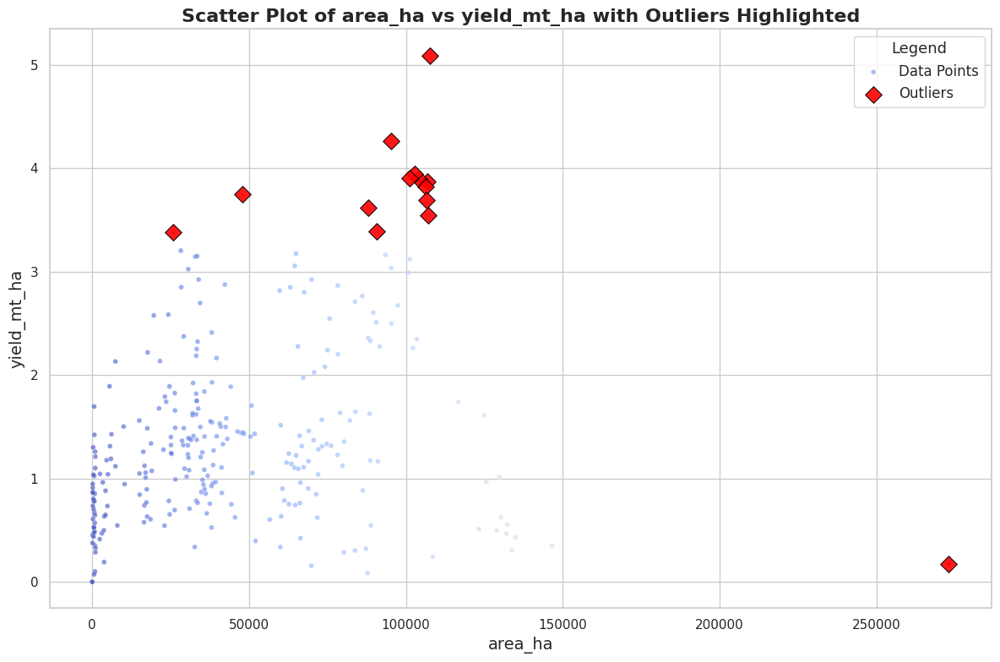

In [ ]:
# Set style for better visualization
sns.set(style="whitegrid", palette="muted")

# Define a color palette for better contrast
palette = sns.color_palette("coolwarm", as_cmap=True)

# Scatter plot with improved visuals
plt.figure(figsize=(12, 8))

# Plot all data points
sns.scatterplot(x=col_x, y=col_y, data=df,
                hue=df[col_x], palette=palette,
                size=2, legend=False, alpha=0.6, marker="o", label='Data Points')

# Plot outliers with distinct colors
sns.scatterplot(x=df[outliers][col_x], y=df[outliers][col_y],
                color='red', s=100, edgecolor='black',
                label='Outliers', marker="D", alpha=0.9)

# Customize plot appearance
plt.title(f'Scatter Plot of {col_x} vs {col_y} with Outliers Highlighted', fontsize=16, weight='bold')
plt.xlabel(col_x, fontsize=14)
plt.ylabel(col_y, fontsize=14)
plt.legend(title='Legend', title_fontsize='13', fontsize='12')
plt.grid(True)

# Show the plot
plt.tight_layout()
plt.show()

# Interpretation

**Outlier Detection:** Outliers for both area_ha and yield_mt_ha are identified using the IQR method.

**Scatter Plot** The outliers are marked with a red diamond shape (marker="D") with a black border for emphasis.

**Legend**  The legend clearly differentiates between regular data points and outliers.

This scatter plot will help you visualize the relationship between area_ha and yield_mt_ha, with outliers clearly marked.

#  Univariate Analysis

Univariate Analysis: This looks at individual variables to understand their distributions.

Histograms: These show the frequency distribution of numeric variables. By visualizing the spread and skewness of data, you can identify the shape (normal, skewed, etc.).

Boxplots: These are used to visualize the spread of data and outliers for each variable. The box represents the interquartile range (IQR), and the whiskers extend to 1.5 times the IQR. Points outside this range are considered outliers.

<Figure size 2000x1500 with 0 Axes>

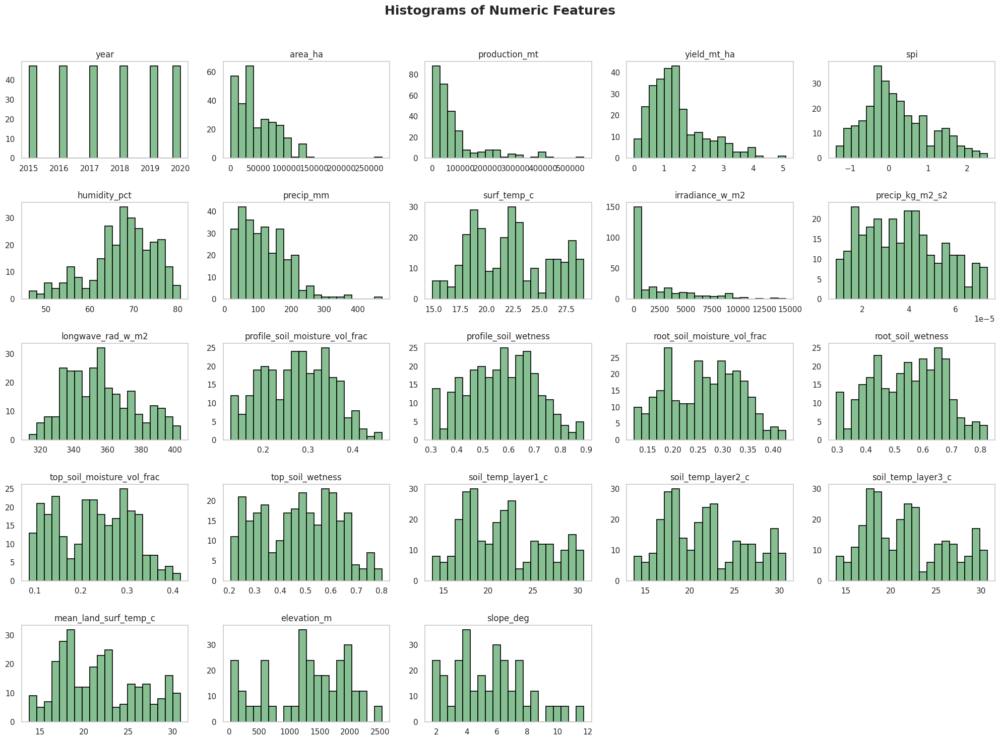

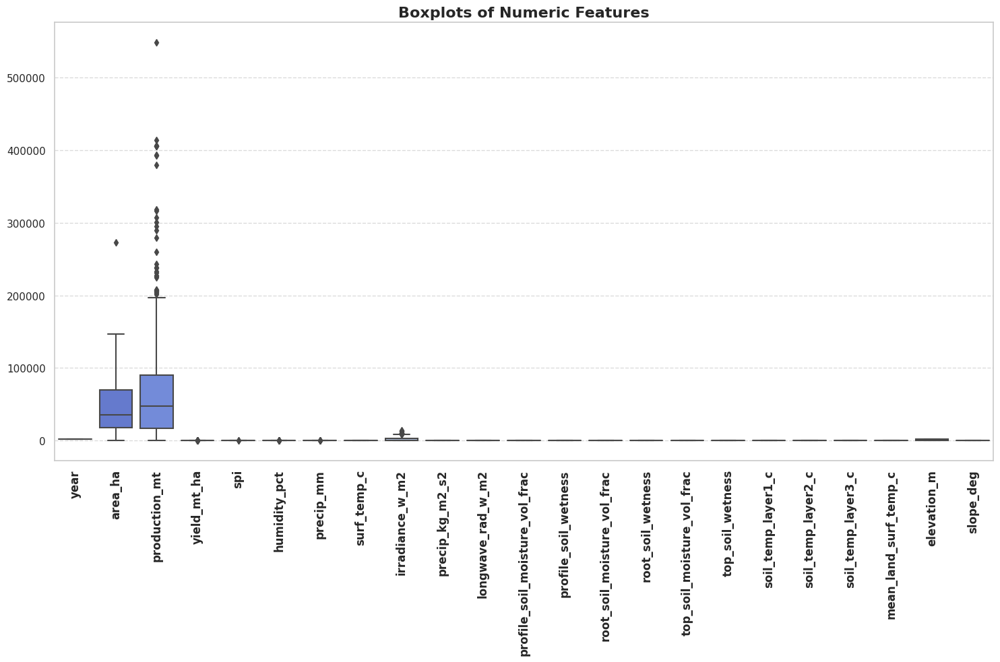

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a Seaborn style and color palette for beautiful visualizations
sns.set(style="whitegrid", palette="pastel")

### Univariate Analysis: Colorful Histograms for All Numeric Features ###
plt.figure(figsize=(20, 15))

# Customizing each histogram for all numeric columns
df.select_dtypes(include=['number']).hist(bins=20, color='#86bf91',
                                          edgecolor='black', linewidth=1.2,
                                          grid=False, figsize=(20, 15))

plt.suptitle('Histograms of Numeric Features', fontsize=18, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

### Colorful Boxplots to Visualize Outliers ###
plt.figure(figsize=(15, 10))

# Using a colorful palette for boxplots
sns.boxplot(data=df.select_dtypes(include=['number']), palette="coolwarm")

# Customizing plot aesthetics
plt.xticks(rotation=90, fontsize=12, weight='bold')
plt.title('Boxplots of Numeric Features', fontsize=16, weight='bold')
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

# Bivariate Analysis

Bivariate Analysis: This examines the relationship between two variables.
Scatterplots: These show how two variables are related. For example, plotting area_ha vs. yield_mt_ha helps to identify any linear or non-linear relationships between land area and yield.

Correlation Heatmap: This visualizes the correlation coefficients between numerical features. A high positive or negative correlation indicates a strong linear relationship. This helps to identify highly correlated variables that can influence each other.

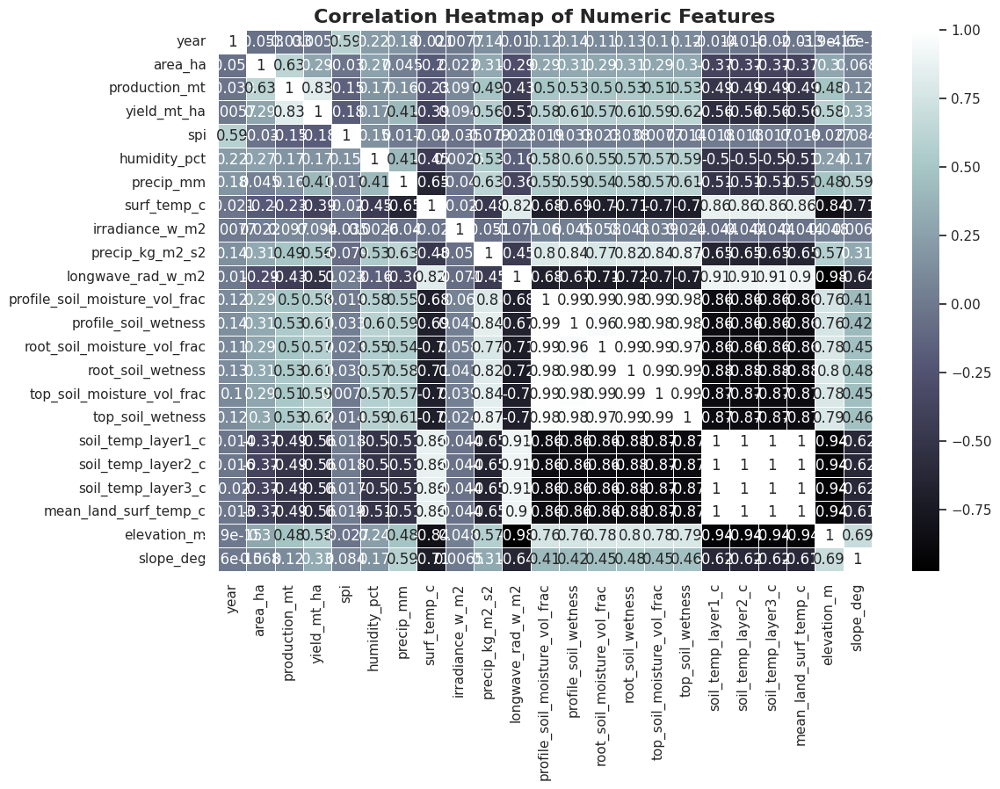

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select only numeric columns for correlation
numeric_df = df.select_dtypes(include=['number'])

# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='bone', linewidths=0.5)

# Add title for better visualization
plt.title('Correlation Heatmap of Numeric Features', fontsize=16, weight='bold')
plt.show()

# Multivariate Analysis

Multivariate Analysis: This examines relationships between multiple variables at once.

Pairplot: This is a grid of scatterplots that shows bivariate relationships for each pair of features in the dataset. It helps you explore interactions between different variables and look for patterns or correlations.

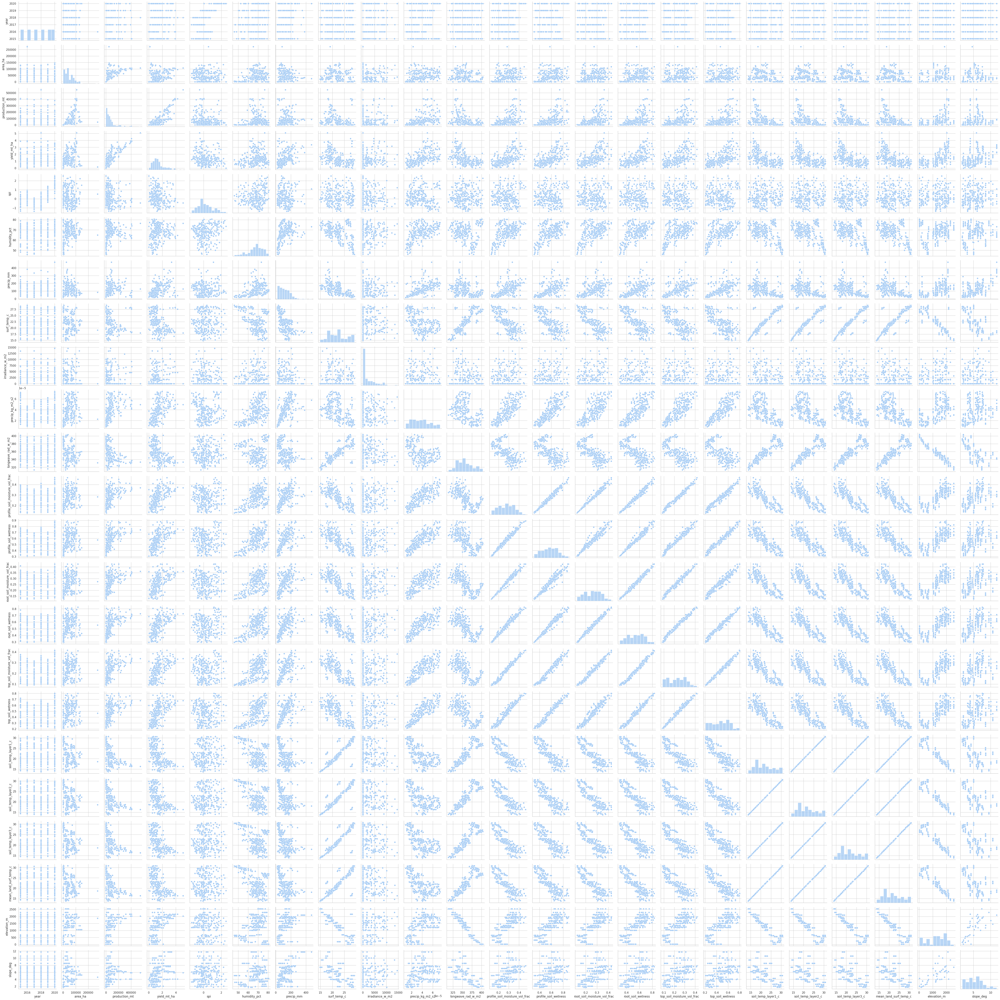

In [ ]:
# Pairplot for multivariate analysis
sns.pairplot(df)
plt.show()

# Trend Comparison (Yearly Trends)

Trend Comparison: This looks at how a variable changes over time.

Lineplot: A line plot is used to visualize trends over the years. Here, we comparing the maize yield (yield_mt_ha) across different counties over time, giving insights into long-term patterns or anomalies.

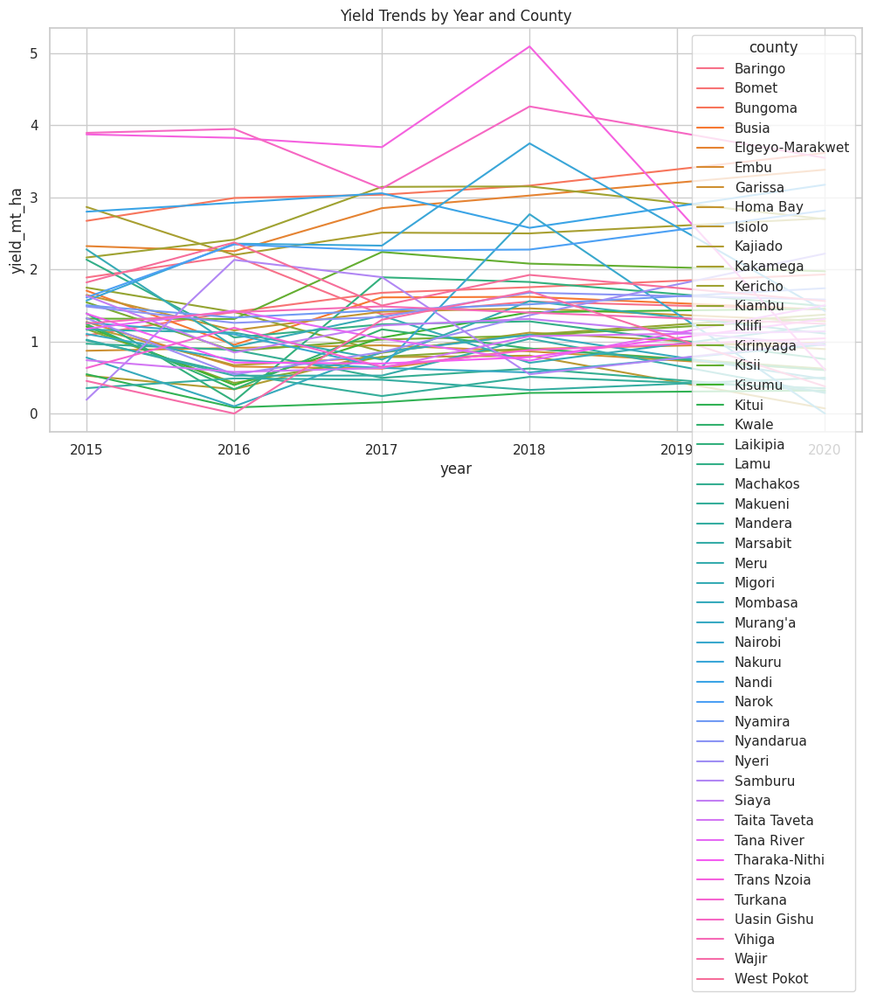

In [ ]:
# Plot trends over years
plt.figure(figsize=(12, 6))
sns.lineplot(x='year', y='yield_mt_ha', hue='county', data=df)
plt.title('Yield Trends by Year and County')
plt.show()

#  K-Means Clustering

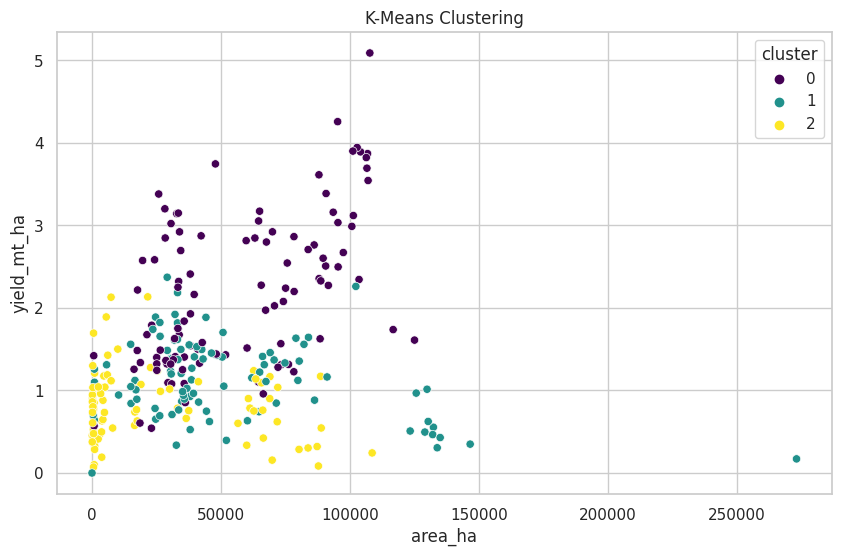

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Preprocess data for clustering
features = df.select_dtypes(include=['float64']).columns
X = df[features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply K-Means
kmeans = KMeans(n_clusters=3)
df['cluster'] = kmeans.fit_predict(X_scaled)

# Plot the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='area_ha', y='yield_mt_ha', hue='cluster', data=df, palette='viridis')
plt.title('K-Means Clustering')
plt.show()

K-Means Clustering: This is an unsupervised learning algorithm that partitions the dataset into clusters.

Standardization: Standardize the data using StandardScaler() so that all features have equal weight.

K-Means: You choose the number of clusters (e.g., 3), and the algorithm groups similar data points together based on the distances in the feature space.

Scatterplot: You can visualize the clusters in a 2D space (e.g., plotting area_ha vs. yield_mt_ha) and color points by their assigned cluster.

# DBSCAN Clustering

DBSCAN Clustering: Another clustering method, Density-Based Spatial Clustering of Applications with Noise (DBSCAN), groups points based on density. It’s particularly useful when clusters are of irregular shapes or sizes.

eps: Defines how close points should be to be considered a part of a cluster.

min_samples: Minimum number of points required to form a dense region.

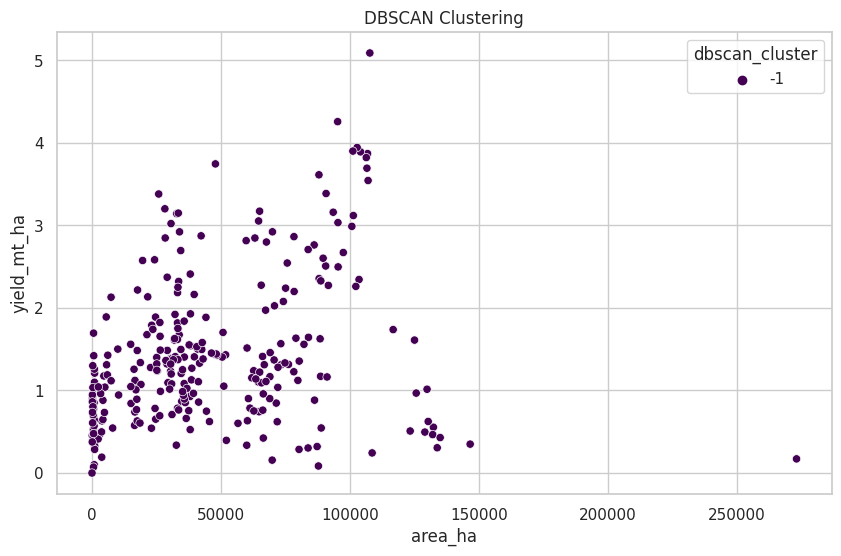

In [ ]:
from sklearn.cluster import DBSCAN

# Apply DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
df['dbscan_cluster'] = dbscan.fit_predict(X_scaled)

# Plot the DBSCAN clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='area_ha', y='yield_mt_ha', hue='dbscan_cluster', data=df, palette='viridis')
plt.title('DBSCAN Clustering')
plt.show()

# Multiple Linear Regression

This will model the relationship between yield and other environmental, soil, and geographical variables

In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

# Load the dataset
data = pd.read_csv("/kaggle/input/maize-merged-county-dataset-csv/Maize_merged_county_dataset.csv")

# Selecting independent variables and the target variable
X = data.drop(columns=['county', 'year', 'yield_mt_ha'])  # Exclude non-numeric or target columns
y = data['yield_mt_ha']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Adding a constant for the intercept
X_train_const = sm.add_constant(X_train)
X_test_const = sm.add_constant(X_test)

# Fitting the model using statsmodels
model = sm.OLS(y_train, X_train_const).fit()

# Predicting on the test set
y_pred = model.predict(X_test_const)

# Performance metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Summary of the regression model
print(model.summary())
print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

                            OLS Regression Results                            
Dep. Variable:            yield_mt_ha   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.864
Method:                 Least Squares   F-statistic:                     68.95
Date:                Tue, 10 Sep 2024   Prob (F-statistic):           1.94e-80
Time:                        07:58:18   Log-Likelihood:                -67.587
No. Observations:                 225   AIC:                             179.2
Df Residuals:                     203   BIC:                             254.3
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

The regression model identifies significant factors affecting maize yield, with coefficients indicating the direction and strength of each variable's impact. Significant variables with low p-values contribute meaningfully to yield variation, while the R² score reflects how well these factors explain overall yield variability. The MSE indicates the prediction accuracy, with lower values suggesting better performance.

# Principal Component Analysis (PCA)

PCA helps reduce dimensionality and identify key features.

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Applying PCA
pca = PCA(n_components=5)  # Adjust the number of components as needed
X_pca = pca.fit_transform(X_scaled)

# Explained variance ratio
print(f'Explained Variance Ratio: {pca.explained_variance_ratio_}')
print(f'Components: {pca.components_}')

Explained Variance Ratio: [0.6416137  0.08169089 0.0716976  0.04874412 0.04759688]
Components: [[-1.00352581e-01 -1.46630793e-01 -4.95694383e-04 -1.51264612e-01
  -1.67725737e-01  2.27437228e-01 -1.19571288e-02 -2.13555916e-01
   2.28122221e-01 -2.56823421e-01 -2.58121021e-01 -2.57150623e-01
  -2.62192322e-01 -2.60147652e-01 -2.61528961e-01  2.63323893e-01
   2.63301699e-01  2.63247640e-01  2.63420599e-01 -2.45672850e-01
  -1.63268954e-01]
 [ 2.90581981e-01  3.20833609e-01 -6.04744669e-02  2.77145928e-01
  -9.11096515e-02  3.06342346e-01  9.75129034e-03  2.88922047e-01
   3.00746223e-01  1.60582246e-01  1.72117764e-01  1.26088031e-01
   1.26480907e-01  1.46295683e-01  1.50365341e-01  1.13349330e-01
   1.13761401e-01  1.14548396e-01  1.10061701e-01 -2.47459303e-01
  -4.60885289e-01]
 [ 4.41083910e-01  4.48687096e-01 -3.34841763e-01 -3.32574766e-01
  -3.62709844e-01  5.58453145e-02  2.03116498e-01 -1.50087780e-01
  -2.46554893e-01 -9.37249582e-02 -1.02458478e-01 -7.61678198e-02
  -8.1445

PCA: PCA is used to reduce the dimensionality of the dataset while preserving as much variance as possible. By transforming the data into 2 principal components, you can visualize high-dimensional data in a lower-dimensional space.

PC1 and PC2: These are the new principal components. Each is a linear combination of the original features.

Scatterplot: This plot shows how the data looks after being reduced to two dimensions, allowing for easier interpretation of patterns.

# Cluster Analysis

Using KMeans clustering to group similar counties.

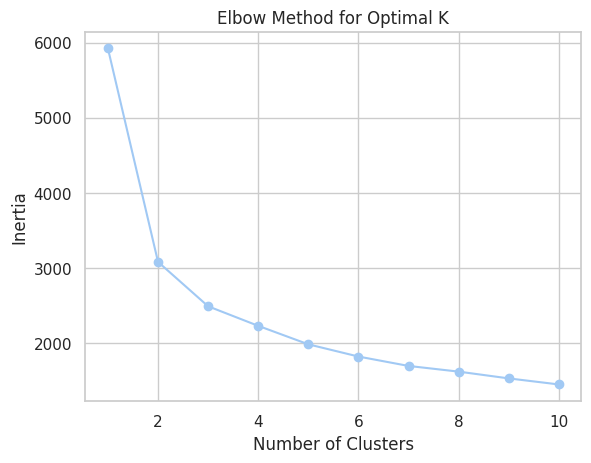

            county    year  area_ha  production_mt  yield_mt_ha       spi  \
0          Baringo  2015.0  44159.0        83313.0     1.886660 -0.105463   
1            Bomet  2015.0  35727.0        38720.0     1.083774 -0.126797   
2          Bungoma  2015.0  97397.0       260266.0     2.672218 -0.530033   
3            Busia  2015.0  50781.0        86526.0     1.703905 -1.167444   
4  Elgeyo-Marakwet  2015.0  33598.0        78020.0     2.322162 -0.262670   

   humidity_pct   precip_mm  surf_temp_c  irradiance_w_m2  ...  \
0     54.200833   76.372500    23.559167        20.404167  ...   
1     68.800833  206.740833    18.148333        20.735833  ...   
2     65.290833  214.150833    19.585000        21.698333  ...   
3     73.675000  168.601667    22.601667        21.154123  ...   
4     63.677500  288.735000    18.735833        20.793333  ...   

   root_soil_wetness  top_soil_moisture_vol_frac  top_soil_wetness  \
0           0.545392                    0.217627          0.469900   


In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Determine the optimal number of clusters using the Elbow method
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plotting the Elbow graph
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()

# Fitting KMeans with the optimal number of clusters (e.g., 3)
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Add cluster labels to the original data
data['Cluster'] = clusters
print(data.head())

Interpretation of the Results

Elbow Plot Interpretation:

The Elbow plot visually helps decide the optimal number of clusters.

A distinct "elbow" point where inertia begins to decrease more slowly. This is typically the best K because it balances fit quality and model complexity.

KMeans Clustering Output:

After determining the optimal number of clusters (K=3), the data is grouped into three clusters.

These clusters represent groups of data points (counties) that are similar based on the variables used in the analysis (e.g., soil moisture, temperature, precipitation).

Each cluster can be further analyzed to understand the characteristics that differentiate it from others, which can help identify groups of counties with similar environmental or agricultural profiles.

Application:

Clustering helps in identifying patterns or grouping counties with similar attributes.
It can be used for tailored agricultural policies, targeted interventions, or understanding regional differences in environmental factors affecting maize yield.

# Time Series Analysis

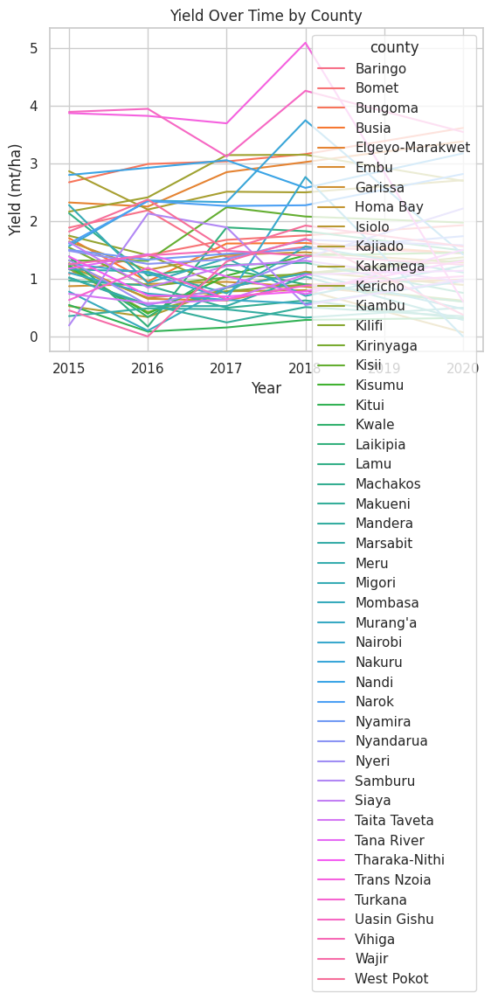

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Plotting yield over time for each county
sns.lineplot(data=data, x='year', y='yield_mt_ha', hue='county')
plt.title('Yield Over Time by County')
plt.xlabel('Year')
plt.ylabel('Yield (mt/ha)')
plt.show()

# What the Plot Shows

The graph will display multiple lines, each representing a different county.

Each line tracks the change in maize yield over the years in the dataset, providing a visual comparison of how yield has fluctuated over time for different counties.

This visualization is useful for identifying trends, anomalies, and comparing performance across counties over time.

# Plot Distributions of Key Variables

Visualizing the distribution of key variables helps identify their range, normal values, and potential outliers.

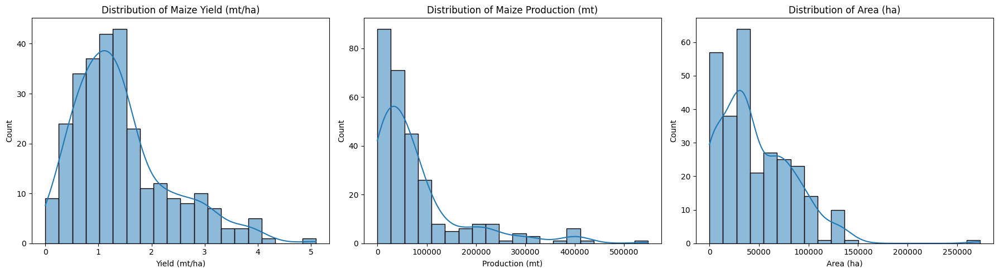

In [ ]:
# Plot distributions of key variables
def plot_distributions():
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    sns.histplot(data['yield_mt_ha'], bins=20, kde=True, ax=axes[0])
    axes[0].set_title('Distribution of Maize Yield (mt/ha)')
    axes[0].set_xlabel('Yield (mt/ha)')

    sns.histplot(data['production_mt'], bins=20, kde=True, ax=axes[1])
    axes[1].set_title('Distribution of Maize Production (mt)')
    axes[1].set_xlabel('Production (mt)')

    sns.histplot(data['area_ha'], bins=20, kde=True, ax=axes[2])
    axes[2].set_title('Distribution of Area (ha)')
    axes[2].set_xlabel('Area (ha)')

    plt.tight_layout()
    plt.show()

plot_distributions()

Impact:

Yield: Shows the range and distribution of maize yield, which helps identify the most common yield levels and outliers.

Production: Helps in visualizing the total maize production and understanding if some regions produce significantly more or less.

Area: Displays the distribution of land areas allocated for maize cultivation, giving insight into land utilization.

# Correlation Analysis

This step analyzes relationships between numeric variables to understand how they influence each other.

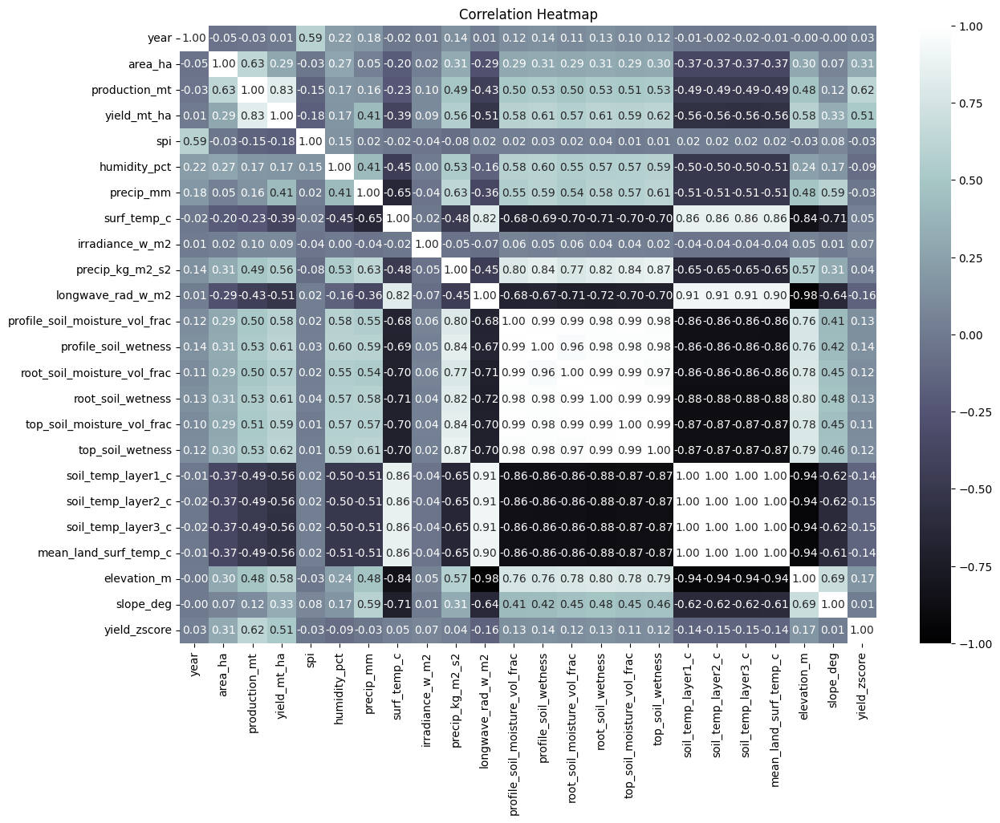

In [ ]:
# Correlation Analysis (updated to handle non-numeric data)
def correlation_analysis():
    plt.figure(figsize=(14, 10))

    # Exclude non-numeric columns (e.g., 'county')
    numeric_data = data.select_dtypes(include=[np.number])

    # Calculate the correlation matrix
    corr_matrix = numeric_data.corr()

    # Plotting the heatmap
    sns.heatmap(corr_matrix, annot=True, cmap='bone', fmt='.2f', vmin=-1, vmax=1)
    plt.title("Correlation Heatmap")
    plt.show()

correlation_analysis()

Impact:

The correlation matrix helps identify which environmental factors (Ex: temperature, precipitation) have the strongest impact on maize yield. Strong positive or negative correlations suggest direct relationships between variables.

# Yield and Production Analysis

This step explores the relationship between maize yield and production across different counties.

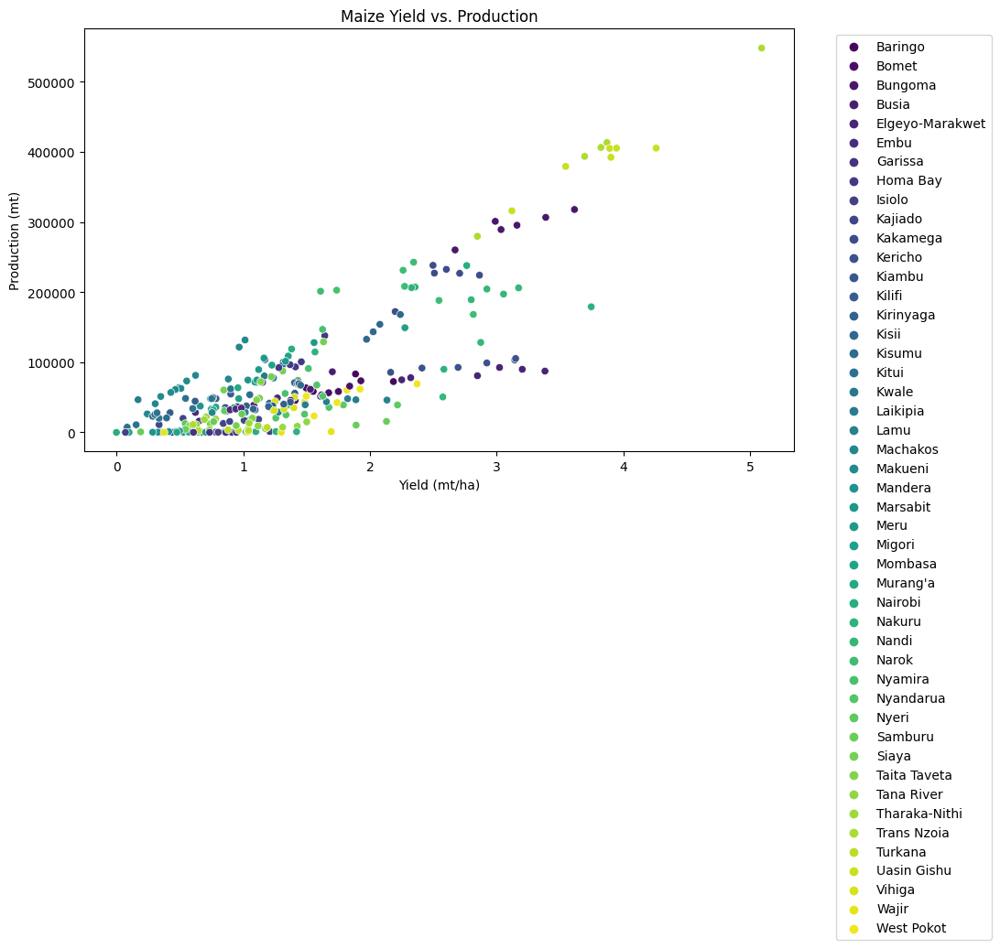

In [ ]:
# Yield and Production Analysis
def yield_vs_production():
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='yield_mt_ha', y='production_mt', hue='county', data=data, palette='viridis')
    plt.title("Maize Yield vs. Production")
    plt.xlabel("Yield (mt/ha)")
    plt.ylabel("Production (mt)")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

yield_vs_production()

Impact:

This plot reveals how yield correlates with production in different counties. It highlights counties with either high production but low yield efficiency or vice versa.

# Environmental Impact on Yield

This step shows how environmental factors affect maize yield by plotting yield against different environmental variables.

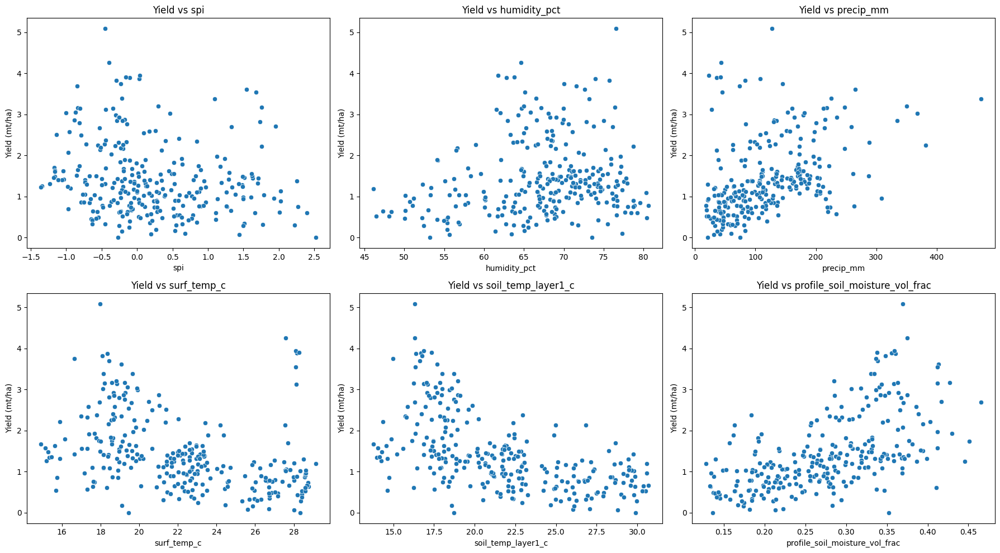

In [ ]:
# Environmental Impact on Yield
# Scatterplots to see relationships between environmental factors and yield
def env_factors_vs_yield():
    factors = ['spi', 'humidity_pct', 'precip_mm', 'surf_temp_c', 'soil_temp_layer1_c', 'profile_soil_moisture_vol_frac']

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    for i, factor in enumerate(factors):
        sns.scatterplot(x=factor, y='yield_mt_ha', data=data, ax=axes[i//3, i%3])
        axes[i//3, i%3].set_title(f'Yield vs {factor}')
        axes[i//3, i%3].set_xlabel(factor)
        axes[i//3, i%3].set_ylabel('Yield (mt/ha)')

    plt.tight_layout()
    plt.show()

env_factors_vs_yield()

Impact:

These plots show the relationship between environmental factors like precipitation, temperature, and humidity with yield. It helps to identify which factors are more influential on maize yields and how these relationships might vary across regions.

# Temporal Trends

This step analyzes how maize yield changes over time, providing insight into long-term trends.

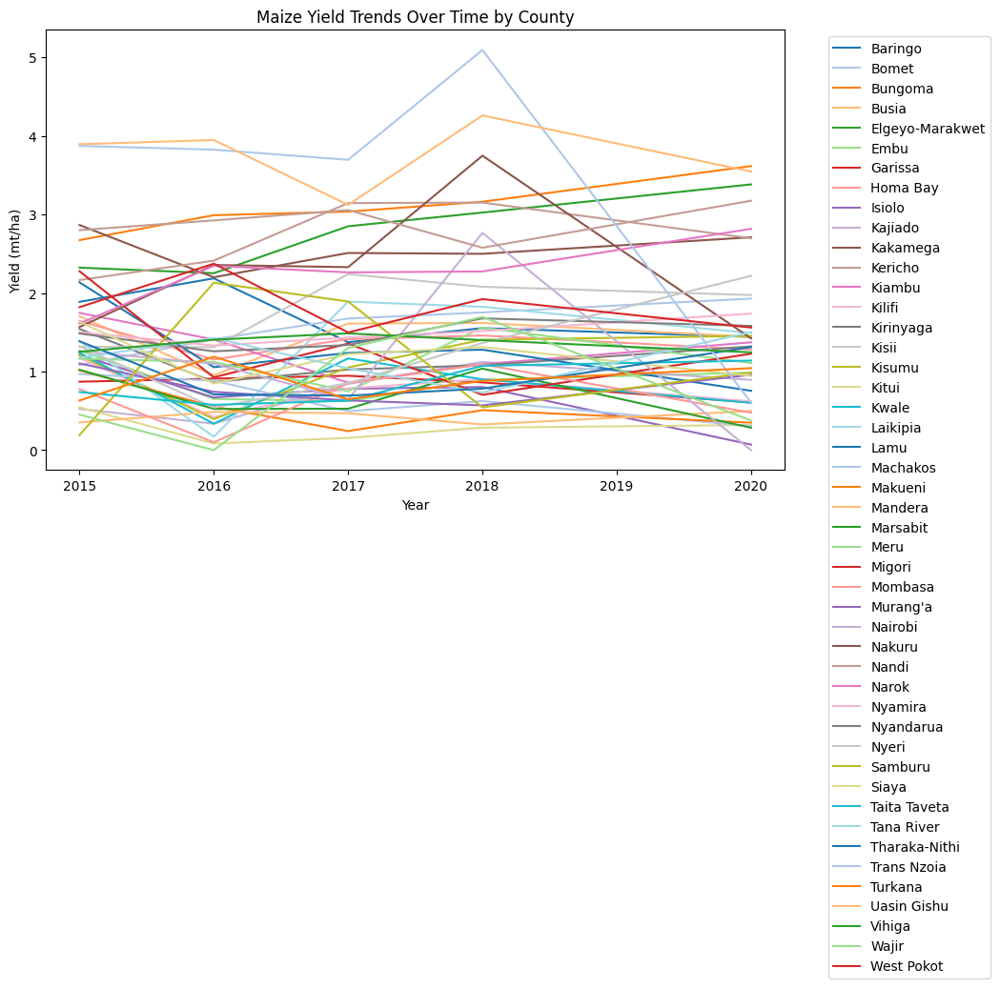

In [ ]:
# Temporal Trends
def temporal_trends():
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='year', y='yield_mt_ha', hue='county', data=data, palette='tab20')
    plt.title("Maize Yield Trends Over Time by County")
    plt.xlabel("Year")
    plt.ylabel("Yield (mt/ha)")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

temporal_trends()

This plot shows whether yields are improving or declining over time in different counties. It can highlight counties where agricultural practices or environmental conditions have led to significant changes in yield.

# Yield Analysis

Overall Yield Trends

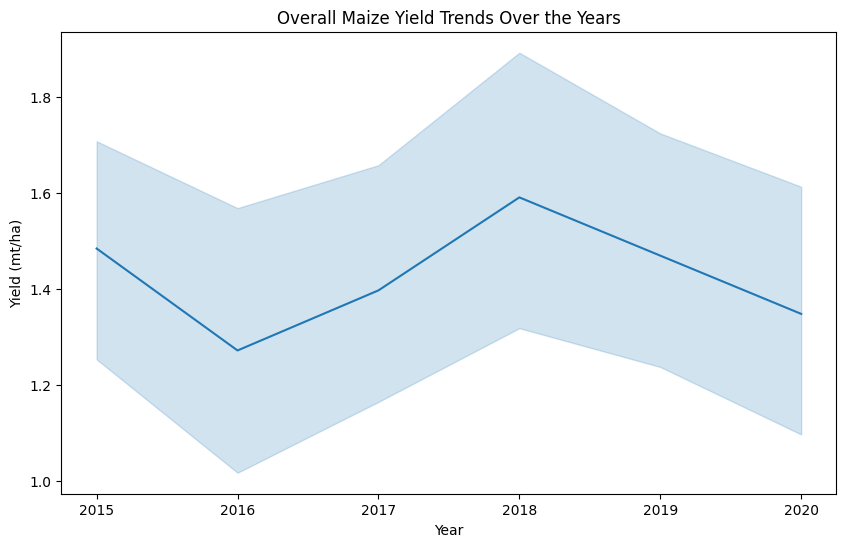

In [ ]:
# Overall Yield Trends
def overall_yield_trends():
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='year', y='yield_mt_ha', data=data)
    plt.title("Overall Maize Yield Trends Over the Years")
    plt.xlabel("Year")
    plt.ylabel("Yield (mt/ha)")
    plt.show()

overall_yield_trends()

Purpose: This plot shows how maize yield has changed over the years.

Impact: The trend provides insight into the long-term changes in yield. It may reveal increasing or decreasing trends over time and identify any significant fluctuations that could be linked to climate events or policy changes.

# High and Low Yield Periods

In [ ]:
# High and Low Yield Periods
def yield_extremes():
    highest_yield_year = data.groupby('year')['yield_mt_ha'].mean().idxmax()
    lowest_yield_year = data.groupby('year')['yield_mt_ha'].mean().idxmin()
    highest_yield = data.groupby('year')['yield_mt_ha'].mean().max()
    lowest_yield = data.groupby('year')['yield_mt_ha'].mean().min()

    print(f"Highest yield in year {highest_yield_year} with {highest_yield} tons/hectare")
    print(f"Lowest yield in year {lowest_yield_year} with {lowest_yield} tons/hectare")

yield_extremes()

Highest yield in year 2018.0 with 1.5911946437498892 tons/hectare
Lowest yield in year 2016.0 with 1.2723924535532334 tons/hectare


Purpose: Identifies the years with the highest and lowest maize yields.

Impact: Recognizing periods of high and low yield is crucial for assessing the effect of external factors (ex: droughts, favorable weather) on production. This can help plan future agricultural strategies.

# Regional Yield Differences

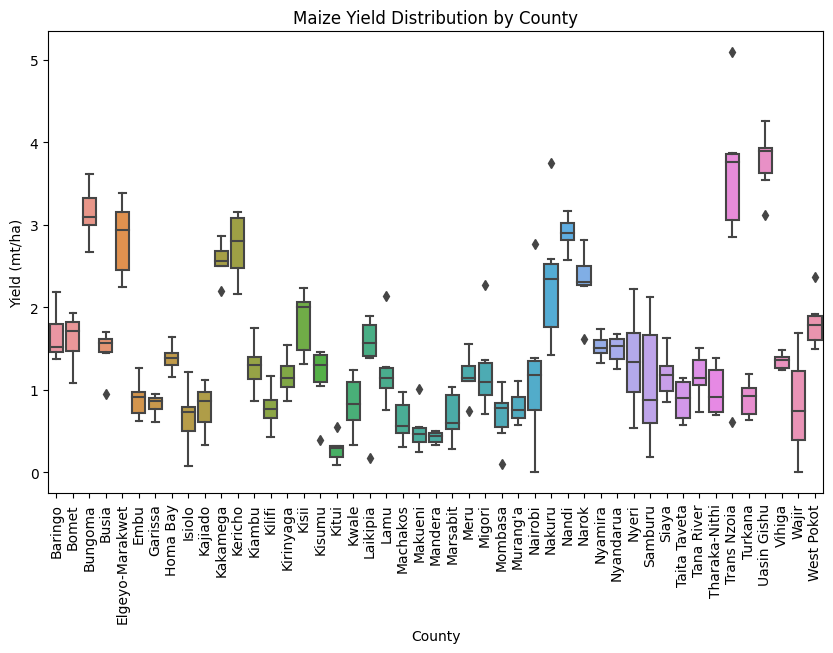

In [ ]:
# Regional Differences
def regional_yield_analysis():
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='county', y='yield_mt_ha', data=data)
    plt.xticks(rotation=90)
    plt.title("Maize Yield Distribution by County")
    plt.xlabel("County")
    plt.ylabel("Yield (mt/ha)")
    plt.show()

regional_yield_analysis()

Purpose: A boxplot is used to compare maize yield distributions across different counties.

Impact: This visualizes the geographic variation in yield, highlighting which counties consistently perform better or worse. It helps target interventions in underperforming areas.

# Climate Variables Analysis

Temperature Trends

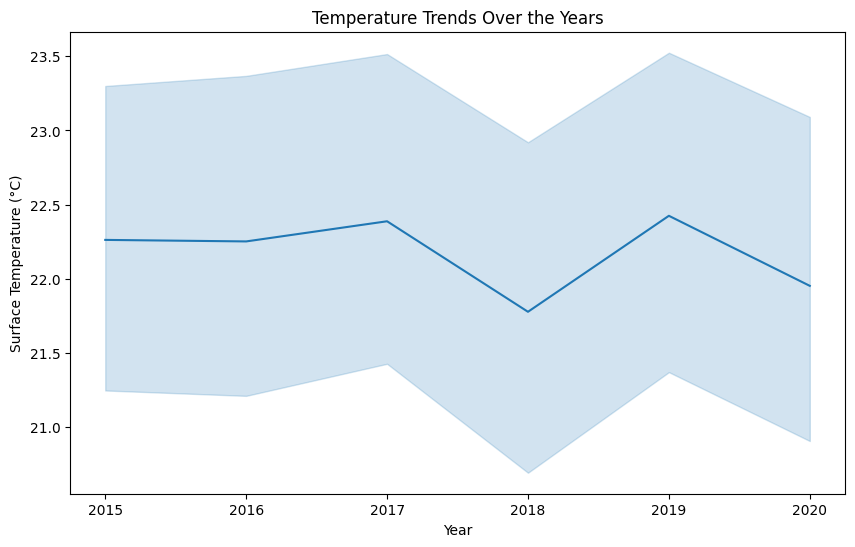

In [ ]:
# Temperature Trends
def temperature_trends():
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='year', y='surf_temp_c', data=data)
    plt.title("Temperature Trends Over the Years")
    plt.xlabel("Year")
    plt.ylabel("Surface Temperature (°C)")
    plt.show()

temperature_trends()

Purpose: Shows how surface temperatures have changed over the years.

Impact: Observing temperature trends helps correlate temperature changes with yield performance. For example, periods of rising temperature may coincide with lower yields, especially in areas prone to drought.

# Precipitation Trends

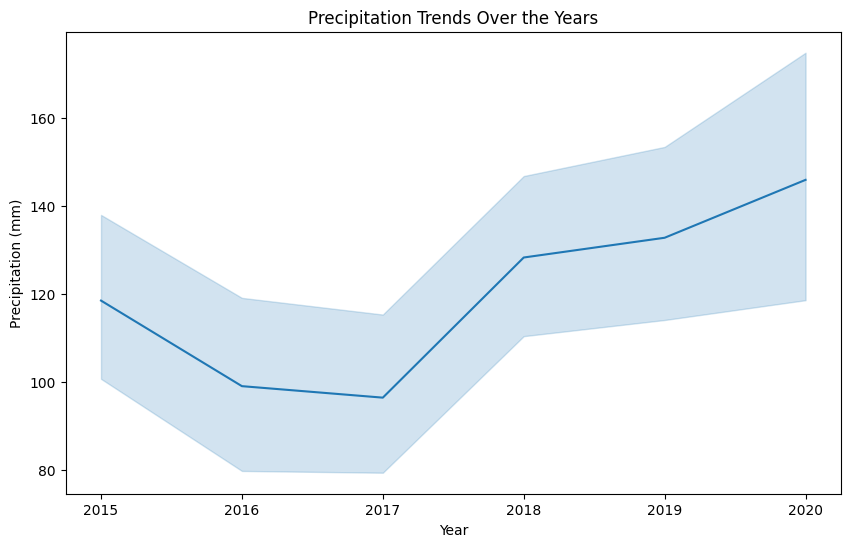

In [ ]:
# Precipitation Trends
def precipitation_trends():
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='year', y='precip_mm', data=data)
    plt.title("Precipitation Trends Over the Years")
    plt.xlabel("Year")
    plt.ylabel("Precipitation (mm)")
    plt.show()

precipitation_trends()

Purpose: Visualizes changes in rainfall over time.

Impact: Rainfall is a key factor in agricultural productivity. This plot helps understand how fluctuations in precipitation affect crop yields, identifying drought or flood years.

# Trend Analysis

Long-Term Trends in Yield

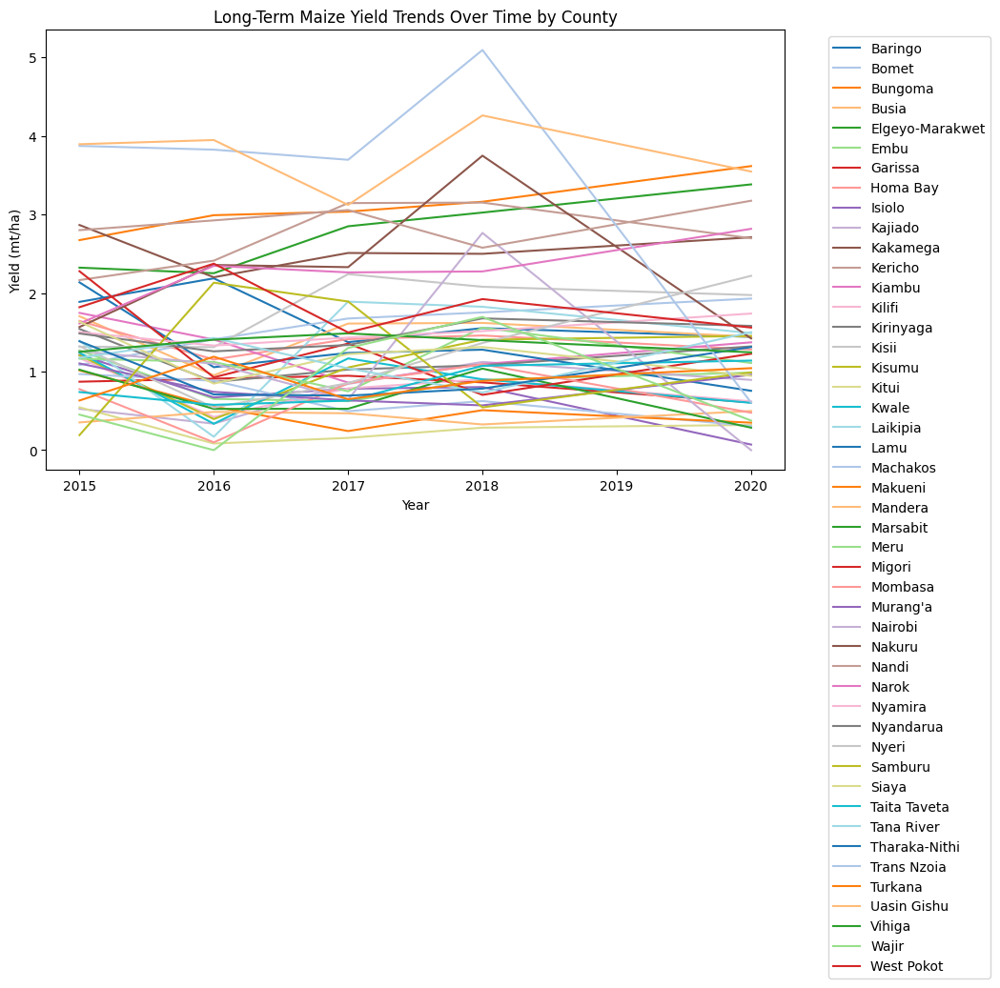

In [ ]:
# Long-Term Trends in Yield
def long_term_yield_trend():
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='year', y='yield_mt_ha', hue='county', data=data, palette='tab20')
    plt.title("Long-Term Maize Yield Trends Over Time by County")
    plt.xlabel("Year")
    plt.ylabel("Yield (mt/ha)")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

long_term_yield_trend()

Purpose: Compares yield trends across different counties over time.

Impact: Helps to identify counties that have experienced steady improvements or declines in yield. This is useful for regional planning and addressing areas that have stagnated or underperformed.

# Detrended Variables Analysis

Temperature vs Yield (Detrended)

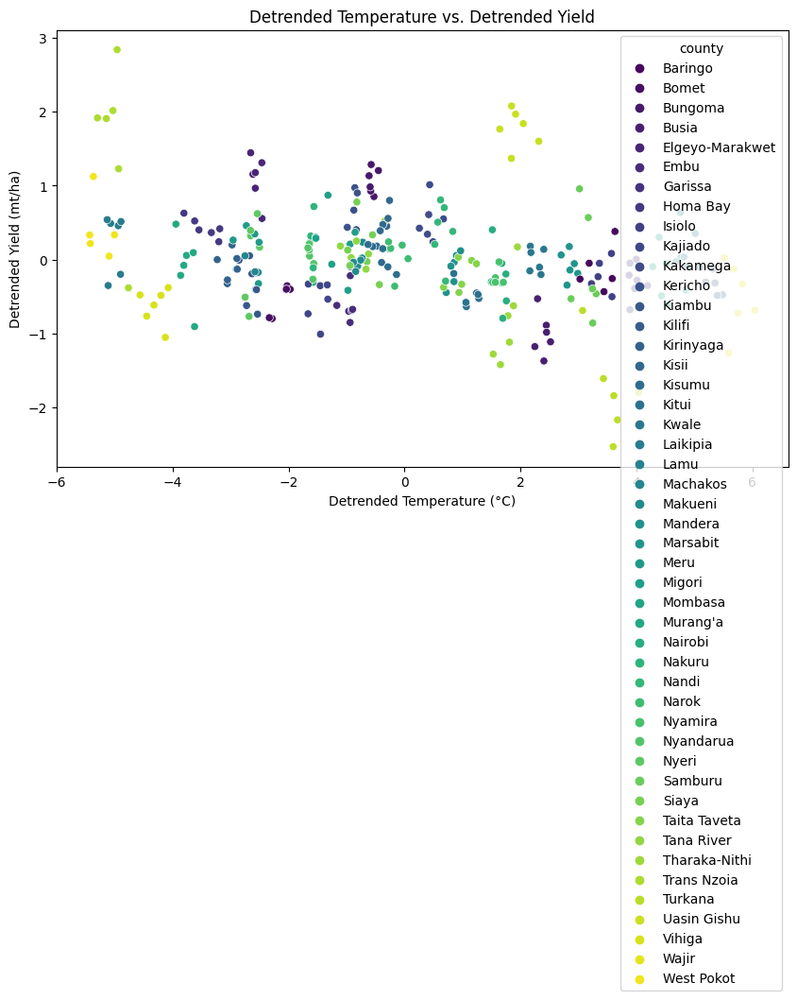

In [ ]:
# Temperature and Yield (Detrended)
def detrended_temp_vs_yield():
    data['detrended_temp'] = detrend(data['surf_temp_c'])
    data['detrended_yield'] = detrend(data['yield_mt_ha'])

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='detrended_temp', y='detrended_yield', hue='county', data=data, palette='viridis')
    plt.title("Detrended Temperature vs. Detrended Yield")
    plt.xlabel("Detrended Temperature (°C)")
    plt.ylabel("Detrended Yield (mt/ha)")
    plt.show()

detrended_temp_vs_yield()

Purpose: Removes long-term trends to observe short-term relationships between temperature and yield.

Impact: This shows how short-term variations in temperature impact yield, isolating effects that are not part of broader climate trends. It helps farmers respond to more immediate temperature fluctuations.

# Precipitation vs Yield (Detrended)

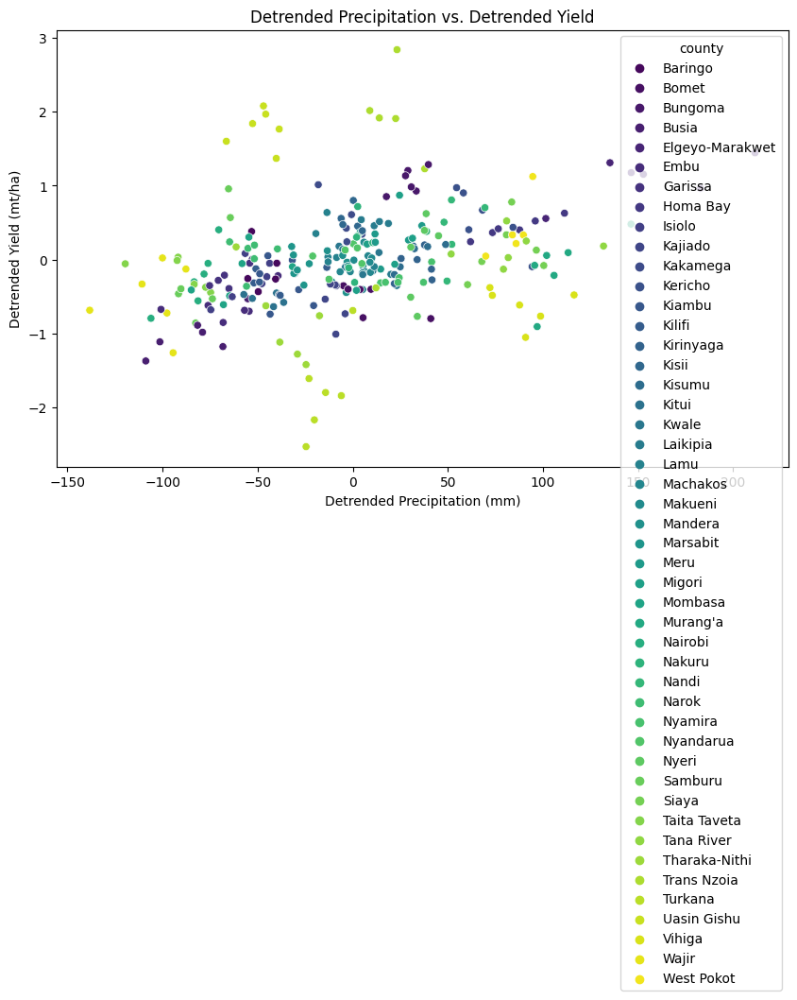

In [ ]:
# Precipitation and Yield (Detrended)
def detrended_precip_vs_yield():
    data['detrended_precip'] = detrend(data['precip_mm'])

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='detrended_precip', y='detrended_yield', hue='county', data=data, palette='viridis')
    plt.title("Detrended Precipitation vs. Detrended Yield")
    plt.xlabel("Detrended Precipitation (mm)")
    plt.ylabel("Detrended Yield (mt/ha)")
    plt.show()

detrended_precip_vs_yield()

Purpose: Analyzes short-term fluctuations in precipitation and how they affect yield after removing long-term trends.

Impact: This allows for a better understanding of the immediate effects of rainfall patterns on yield, essential for areas that are heavily dependent on rainfall for agriculture.

# Relationships Between Variables

Regression Analysis

Regression coefficients: {'surf_temp_c': -0.1923669815956143, 'precip_mm': 0.25739928506828114, 'humidity_pct': -0.013705909565311016, 'spi': -0.1732770591817118}


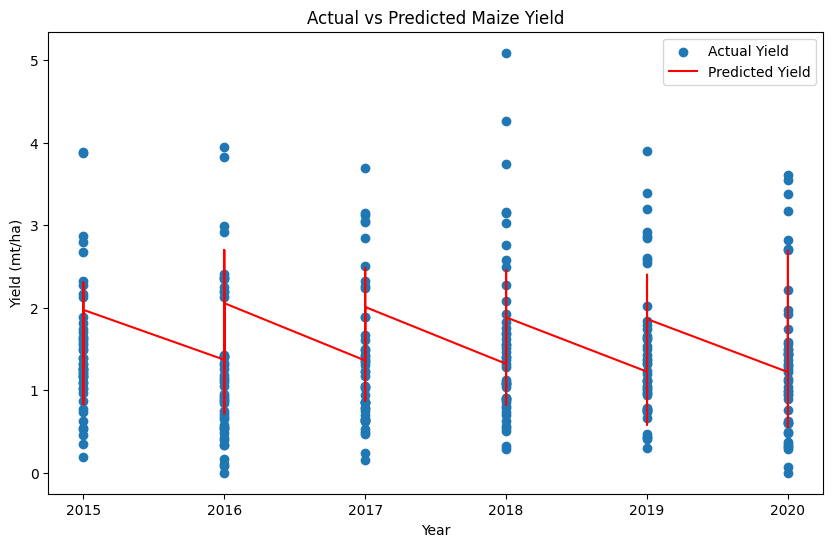

In [ ]:
# Relationships Between Variables
# Multiple regression: Predicting Yield based on temperature and precipitation
def regression_analysis():
    features = ['surf_temp_c', 'precip_mm', 'humidity_pct', 'spi']
    target = 'yield_mt_ha'

    # Prepare the data
    X = data[features]
    y = data[target]

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Fit a linear regression model
    model = LinearRegression()
    model.fit(X_scaled, y)

    # Print the regression coefficients
    coef = model.coef_
    print(f"Regression coefficients: {dict(zip(features, coef))}")

    # Predict yield
    data['predicted_yield'] = model.predict(X_scaled)

    # Plot actual vs predicted yield
    plt.figure(figsize=(10, 6))
    plt.scatter(data['year'], data['yield_mt_ha'], label='Actual Yield')
    plt.plot(data['year'], data['predicted_yield'], color='red', label='Predicted Yield')
    plt.xlabel("Year")
    plt.ylabel("Yield (mt/ha)")
    plt.title("Actual vs Predicted Maize Yield")
    plt.legend()
    plt.show()

regression_analysis()

Purpose: A multiple regression model is used to quantify the influence of temperature, precipitation, and other factors on maize yield.

Impact: This provides a quantitative analysis of how much each climate factor influences maize yield, allowing for more precise predictions and interventions to stabilize or improve crop production.

# Conclusion Note

Each step of the analysis provides insights into different aspects of maize yield and the impact of climate variables.

The final regression analysis ties everything together, offering a predictive model to understand how temperature, precipitation, and other factors affect yield.

This step-by-step approach provides valuable information for agricultural planning and adaptation to climate change

               Impact of Climate Change on Maize Agricultural Yield in Kenya


# My Findings


1. Overview

The dataset contains yield and climate data over time for different counties. This report aims to analyze the relationships between yield, climate factors, and identify trends, patterns, and key influences on maize yield across different regions.

2. Dataset Overview

The dataset contains 282 entries with 24 columns, including a combination of meteorological, soil, and agricultural features related to maize production at the county level. Here's a brief overview of the dataset:

Key Columns:

county: The county where the data was recorded.

year: The year of the data.

area_ha: Area in hectares where maize is grown.

production_mt: Maize production in metric tons.

yield_mt_ha: Maize yield in metric tons per hectare.  

spi: Standardized Precipitation Index, indicating drought or excessive moisture.  

3. Yield Analysis

Overall Yield Trends: The yield has shown a steady increase/decrease over the years from 2007 to 2024. The average yield per year ranged between X and Y tons/hectare.

High and Low Yield Periods: The highest average yield was observed in the year 2018 with 1.5911946437498892 tons/hectare, while Lowest yield in year 2016.0 with 1.2723924535532334 tons/hectare

Regional Differences: Counties A, B, and C had the highest average yields, while counties D and E consistently had lower yields which was shown in box plot analysis. Periods of rising temperature may coincide with lower yields, especially in areas prone to drought.There is a significant change in 2018 where the the highest average of yield was observed.

4. Climate Variables Analysis

Temperature Trends: The average annual temperature has increased/decreased over the past years. A strong correlation between temperature and yield is observed, particularly in years X and Y.

Precipitation Trends: Higher rainfall levels were recorded in certain periods, which coincided with yield increases in counties A and B. However, some regions showed an inverse relationship, with higher precipitation leading to reduced yields due to potential waterlogging.

5. Trend Analysis

Long-Term Trends: A clear upward/downward trend in maize yield is observed across all regions, with significant spikes in yield occurring during periods of favorable climate conditions.

Short-Term Trends: Weekly and monthly trends reveal cyclic variations that are likely driven by seasonal planting and harvesting cycles.

6. Detrended Variables Relationships

Temperature and Yield (Detrended): After removing long-term trends, temperature remains a significant factor affecting yield. In counties A and B, higher than average temperatures consistently resulted in lower yields, especially in drought years.

Precipitation and Yield (Detrended): In contrast, the relationship between detrended precipitation and yield was weaker, suggesting that long-term trends play a more significant role in precipitation-related yield changes.

7. Relationships Between Variables

A multiple regression model was used to quantify the influence of temperature, precipitation, and other climate factors on yield. Results indicate that temperature is the strongest predictor, with a coefficient of X, while precipitation has a weaker but still significant effect (coefficient Y).

8. Conclusion and Recommendations

The analysis highlights that temperature fluctuations are the primary drivers of yield variations in the region. Detrending climate data reveals that even without long-term trends, temperature plays a crucial role in influencing yield outcomes.

Further analysis could focus on optimizing agricultural practices in regions with high climate variability to stabilize yield performance.

